<a href="https://colab.research.google.com/github/JakubChmielewskiRepo/wstep-do-uczenia-maszynowego-175ic/blob/master/lab9/imageProcessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

import imutils
import cv2
from google.colab.patches import cv2_imshow


width=800, height=463, depth=3


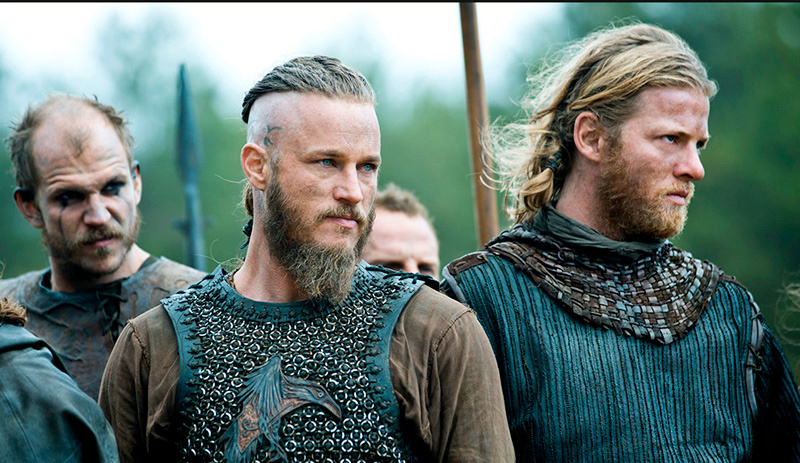

In [7]:
#ładowanie obrazu
image = cv2.imread("vikings.jpg")
(h, w, d) = image.shape

#Wyświetlenie długości, wysokości i głębokości obrazu
print("width={}, height={}, depth={}".format(w, h, d))

#Wyświetlenie obrazu
cv2_imshow(image)

In [8]:
#Pobranie informacji o pikselu w 100-tnym rzędzie i 50-tej kolumnie.
(B, G, R) = image[100, 50]

#Wyświetlenie pobranych informacji.
print("R={}, G={}, B={}".format(R, G, B))

R=186, G=192, B=188


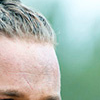

In [27]:
#Pobranie 100x100 pikseli zaczynając od x=320,y=60 a kończąc na x=420,y=160
roi = image[60:160, 320:420]
cv2.imwrite("roi-vikings.jpg", roi)
cv2_imshow(roi)

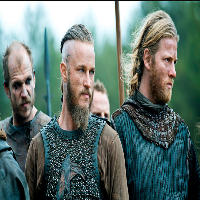

In [28]:
#Zmiana wielkości obrazu na 200x200 pikseli z pominięciem aspect ratio
resized = cv2.resize(image, (200, 200))
cv2.imwrite("resized-vikings.jpg", resized)
cv2_imshow(resized)

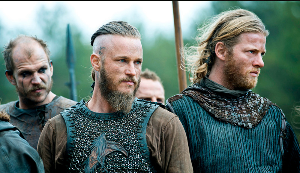

In [29]:
#Zmiana wielkości obrazu z uwzględnieniem aspect ratio
r = 300.0 / w
dim = (300, int(h * r))
resized = cv2.resize(image, dim)
cv2.imwrite("resized-with-aspect-ratio-vikings.jpg", resized)
cv2_imshow(resized)

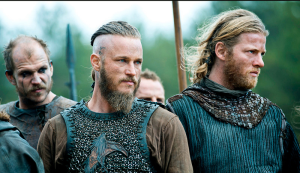

In [30]:
#Zmiana wielkości obrazu za pomocą funkcji imutils.resize, która uwzględnia aspect ratio
resized = imutils.resize(image, width=300)
cv2.imwrite("imutils-resized-vikings.jpg", resized)
cv2_imshow(resized)

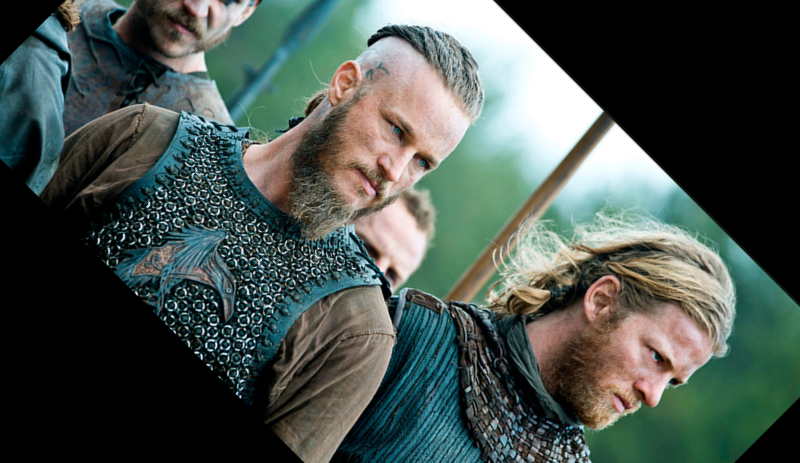

In [37]:
#Rotacja obrazu o 45 stopni w prawo
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, -45, 1.0)
rotated = cv2.warpAffine(image, M, (w, h))
cv2.imwrite("crop-rotated-vikings.jpg", rotated)
cv2_imshow(rotated)

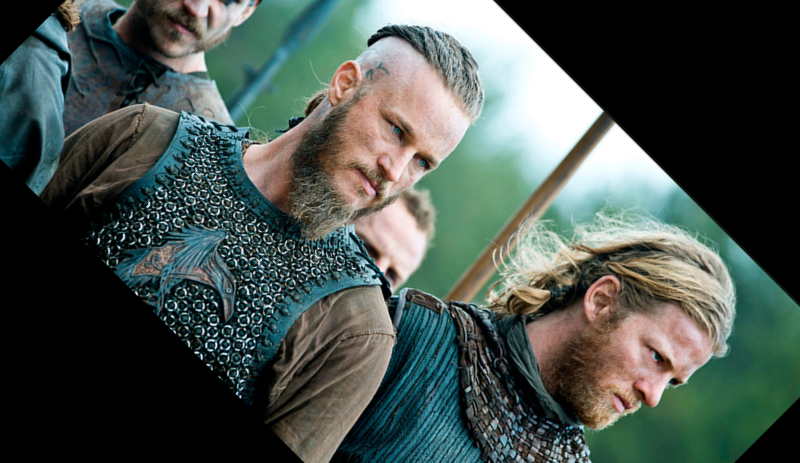

In [36]:
#Uproszczona rotacja obrazu o 45 stopni za pomocą funkcji imutils.rotate
rotated = imutils.rotate(image, -45)
cv2.imwrite("crop-imutils-rotated-vikings.jpg", rotated)
cv2_imshow(rotated)

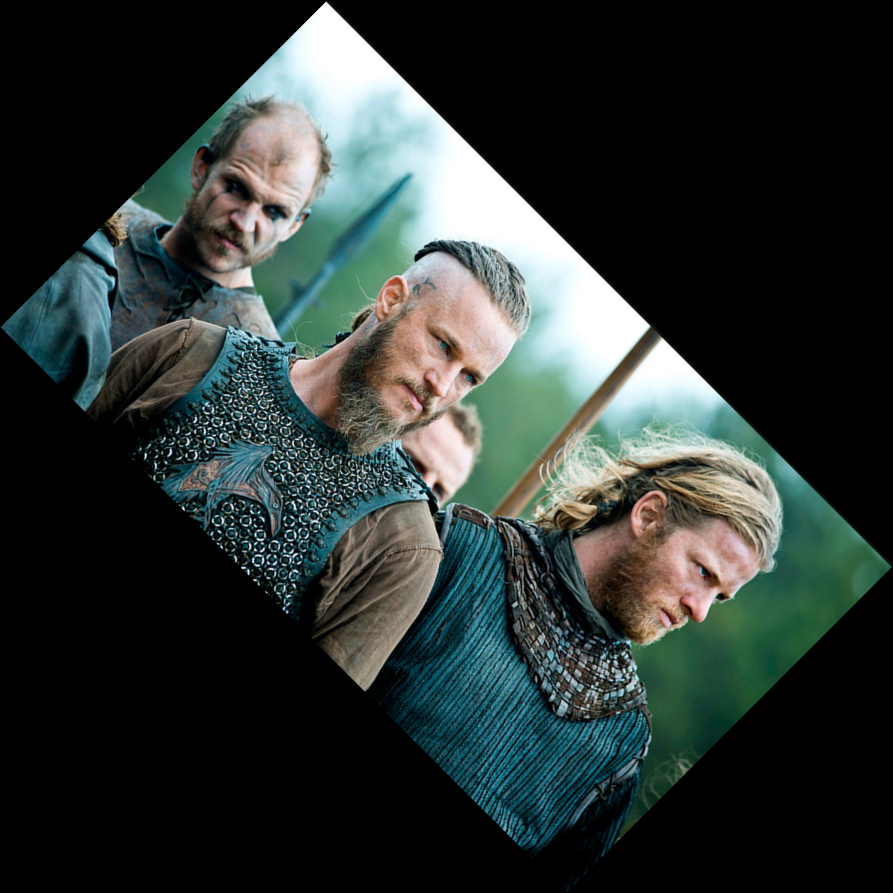

In [35]:
#Uproszczona rotacja obrazu o 45 stopni za pomocą funkcji imutils.rotate_bound, która dostosowuje podgląd zdjęcia tak by nie zostało ono przycięte.
rotated = imutils.rotate_bound(image, 45)
cv2.imwrite("imutils-rotated-without-crop-vikings.jpg", rotated)
cv2_imshow(rotated)

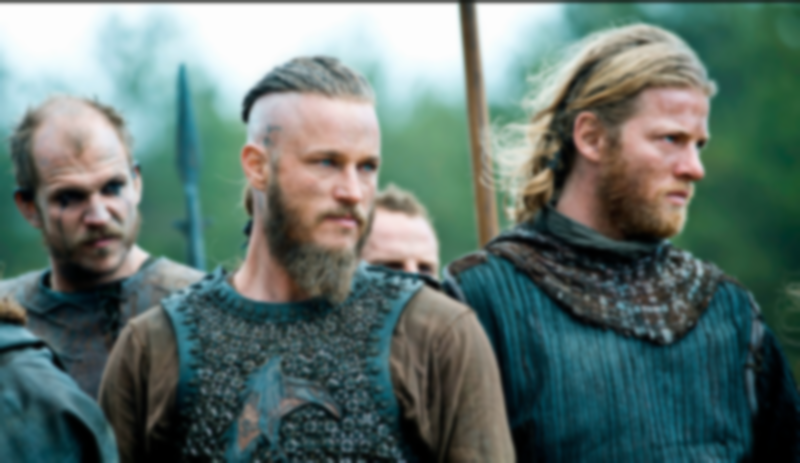

In [34]:
#Rozmycie obrazu
blurred = cv2.GaussianBlur(image, (11, 11), 0)
cv2.imwrite("blurred-vikings.jpg", blurred)
cv2_imshow(blurred)

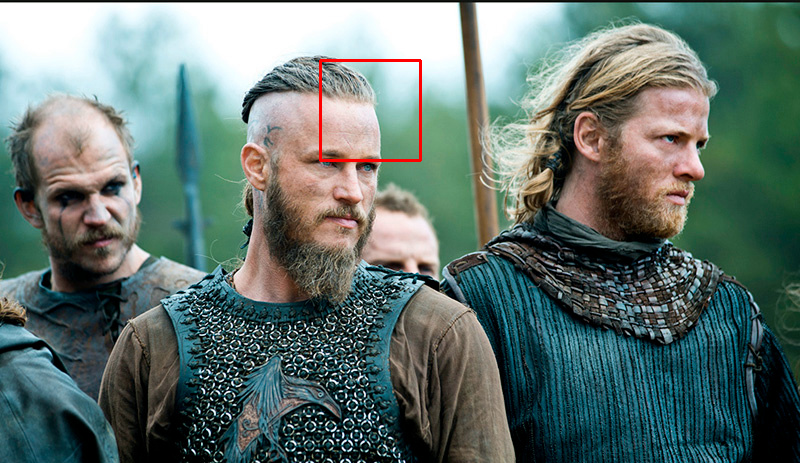

In [23]:
#Utworzenie kopii obrazu i narysowanie prostokąta
output = image.copy()
cv2.rectangle(output, (320, 60), (420, 160), (0, 0, 255), 2)
cv2.imwrite("rectangle-vikings.jpg", output)
cv2_imshow(output)

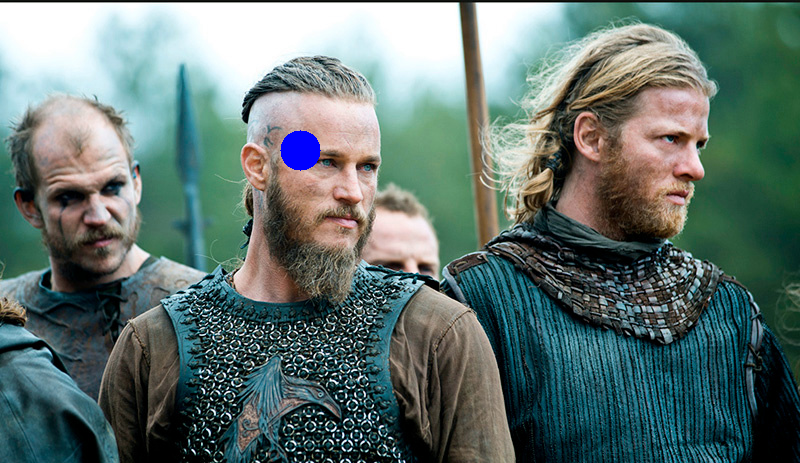

In [38]:
#Kopiowanie obrazu i narysowanie niebieskiego koła
output = image.copy()
cv2.circle(output, (300, 150), 20, (255, 0, 0), -1)
cv2.imwrite("circle-vikings.jpg", output)
cv2_imshow(output)

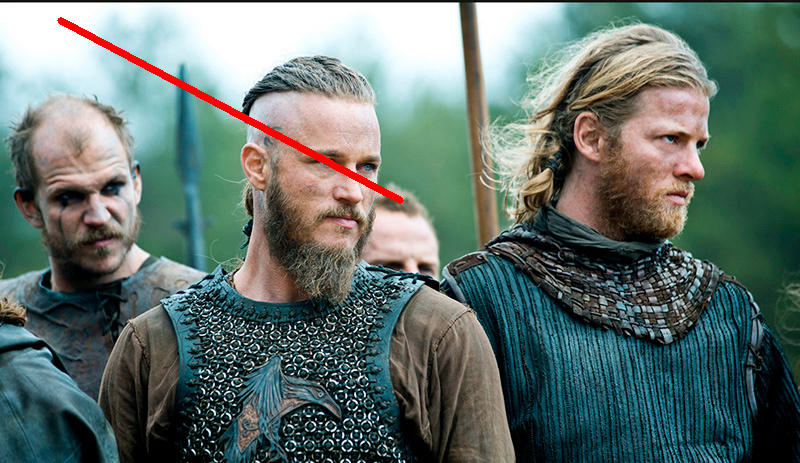

In [39]:
#Kopiowanie obrazu i narysowanie czerwonej linii o grubości 5 pikseli
output = image.copy()
cv2.line(output, (60, 20), (400, 200), (0, 0, 255), 5)
cv2.imwrite("line-vikings.jpg", output)
cv2_imshow(output)

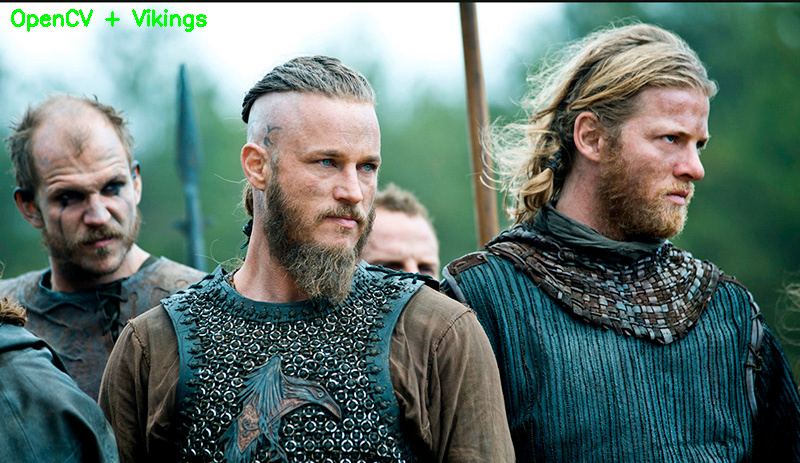

In [40]:
#Kopiowanie obrazu i narysowanie napisu
output = image.copy()
cv2.putText(output, "OpenCV + Vikings", (10, 25), 
	cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
cv2.imwrite("text-vikings.jpg", output)
cv2_imshow(output)

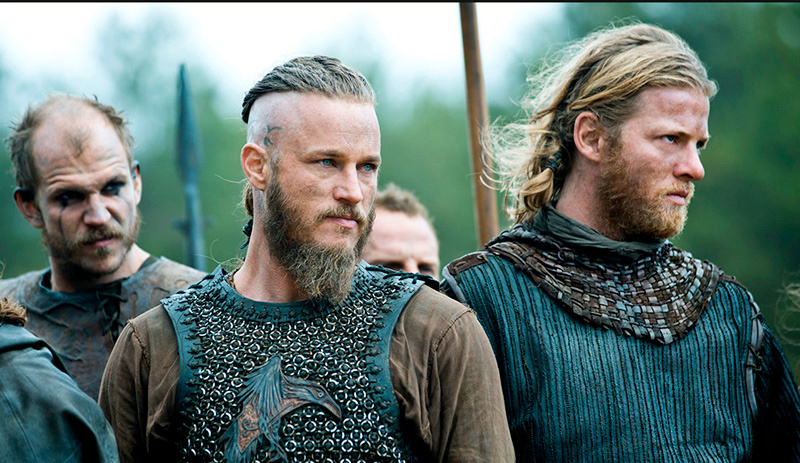

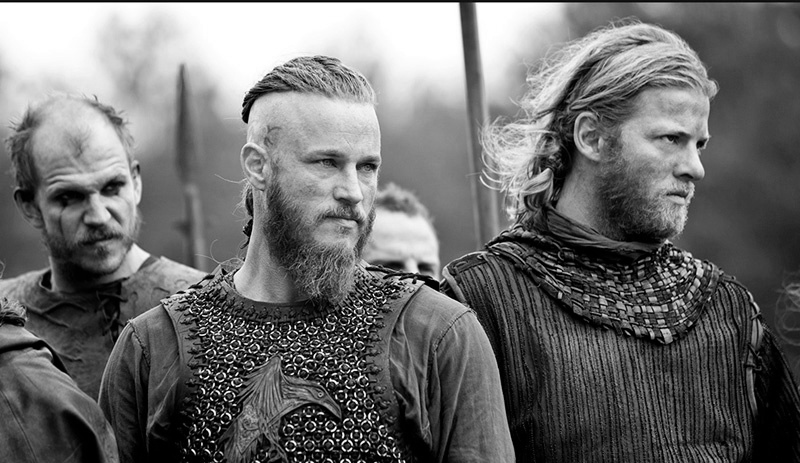

In [42]:
#Konwersja zdjęcia na czarno białe
output = image.copy()
gray = cv2.cvtColor(output, cv2.COLOR_BGR2GRAY)
cv2_imshow(output)
cv2.imwrite("gray-scaled-vikings.jpg", gray)
cv2_imshow(gray)

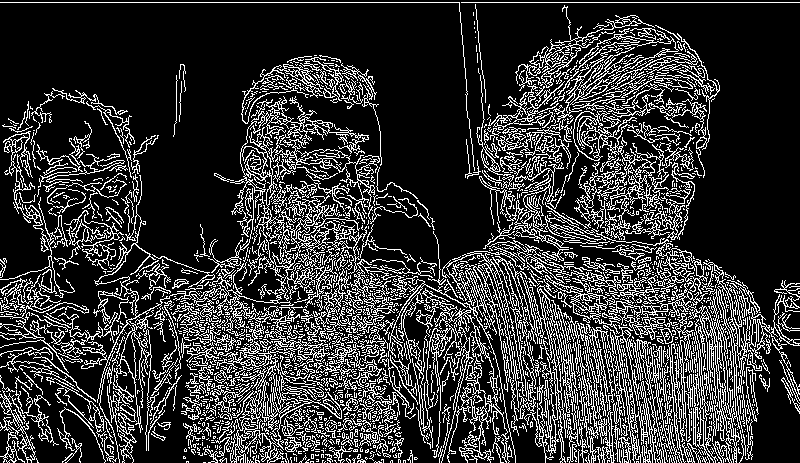

True

In [46]:
#Wykrywanie krawędzi
edged = cv2.Canny(gray, 30, 150)
cv2_imshow(edged)
cv2.imwrite("edged-vikings.jpg", edged)


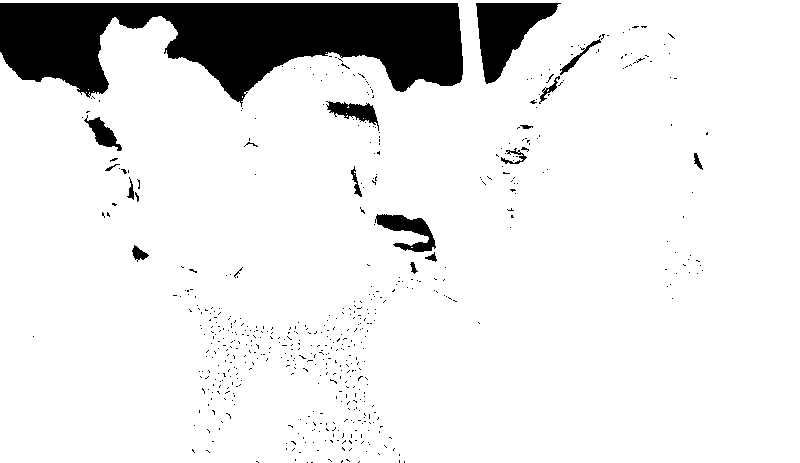

In [47]:
#wyznaczanie poziomu jasności obrazu
thresh = cv2.threshold(gray, 225, 255, cv2.THRESH_BINARY_INV)[1]
cv2.imwrite("tresholded-vikings.jpg", thresh)
cv2_imshow(thresh)


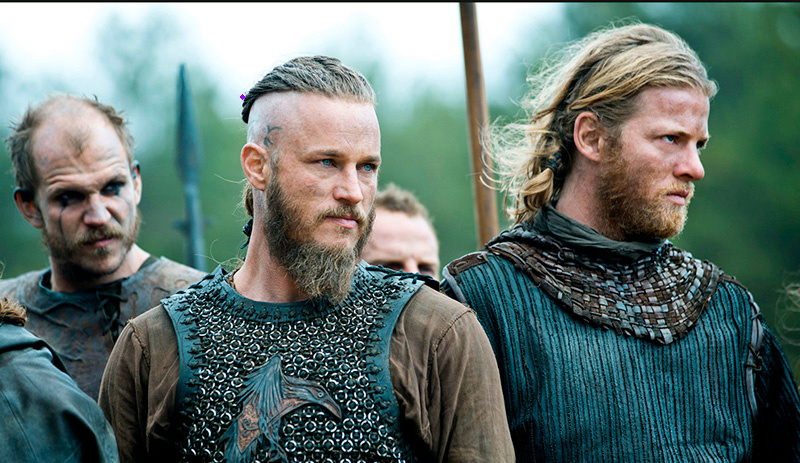

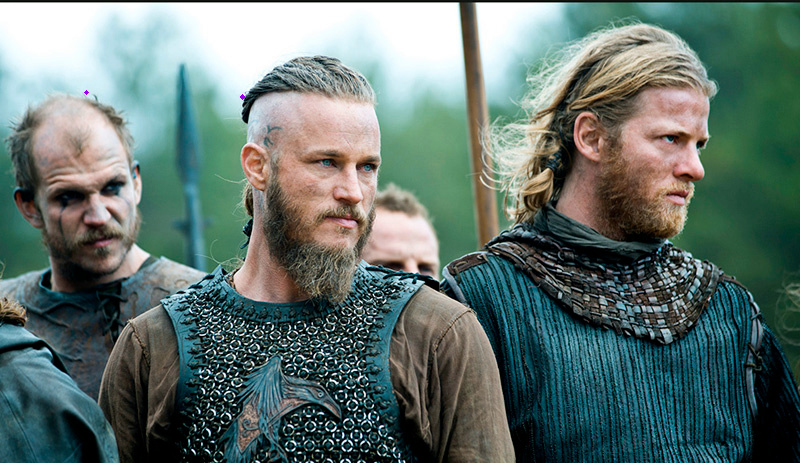

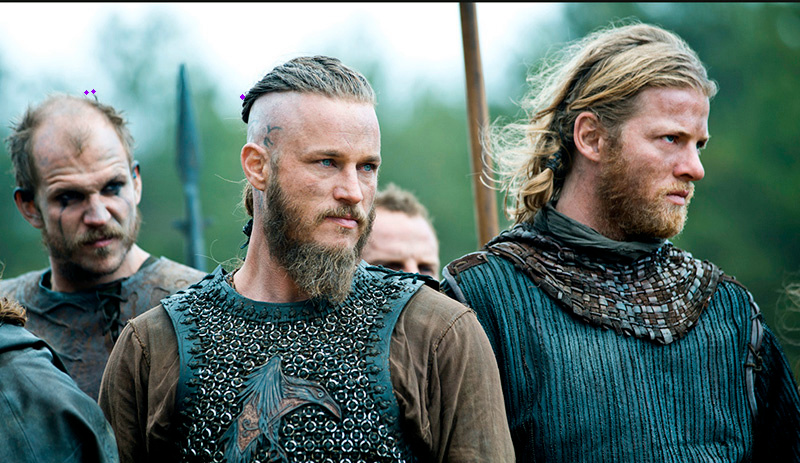

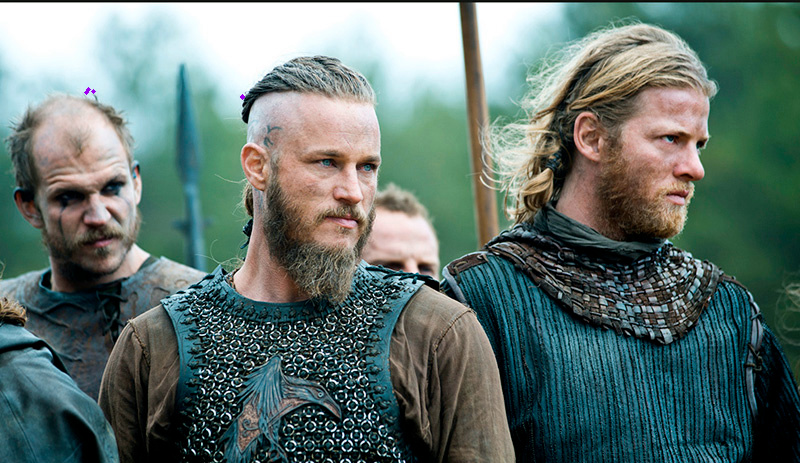

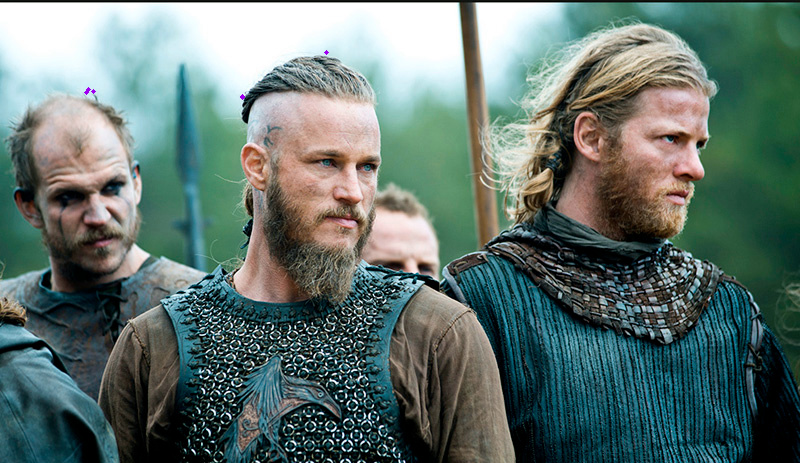

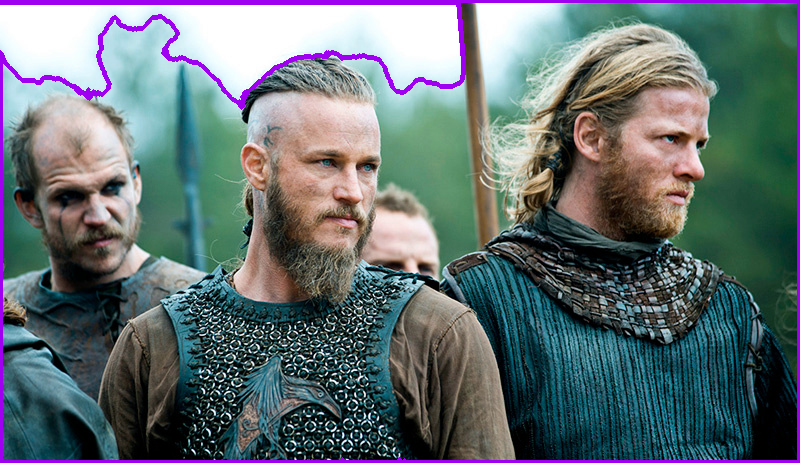

True

In [52]:
#Znajdowanie oraz oznaczanie kontur
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
	cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
output = image.copy()

# loop over the contours
for c in cnts:

	cv2.drawContours(output, [c], -1, (240, 0, 159), 3)
	cv2_imshow(output)
cv2.imwrite("contoured-vikings.jpg", output)

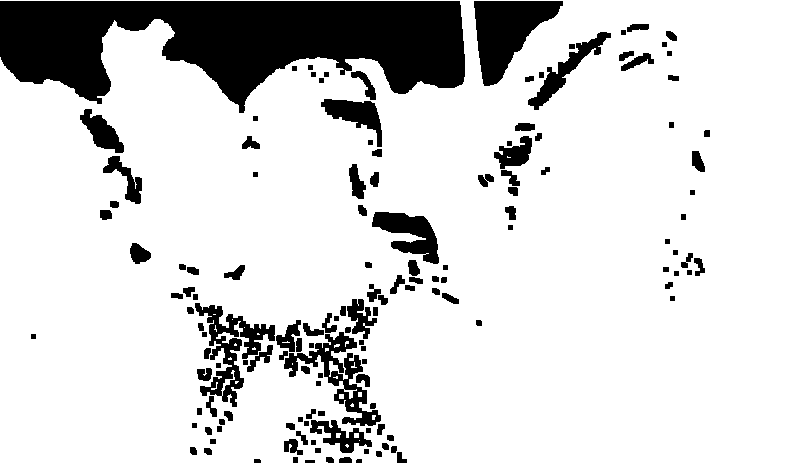

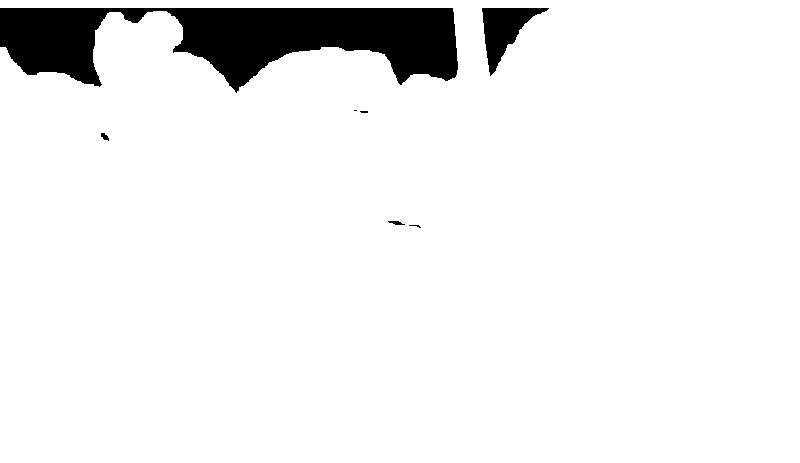

In [53]:
#Erozje i dylatacje
mask = thresh.copy()
mask_2 = thresh.copy()
mask = cv2.erode(mask, None, iterations=2)
mask_2 = cv2.dilate(mask_2, None, iterations=5)
cv2.imwrite("eroded-vikings.jpg", mask)
cv2.imwrite("dilated-vikings.jpg", mask_2)
cv2_imshow(mask)
cv2_imshow(mask_2)

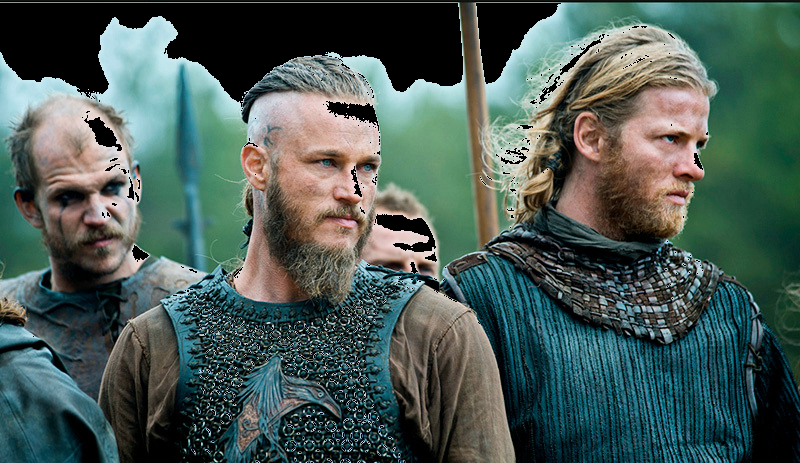

In [55]:
#Operacja bitowa
mask = thresh.copy()
output = cv2.bitwise_and(image, image, mask=mask)
cv2.imwrite("bitwised-vikings.jpg", output)
cv2_imshow(output)